In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!pip install numpy
!pip install opencv-python
!pip install matplotlib


In [ ]:
import numpy as np
import os

# Google Drive'daki veri seti yolunu belirtin
data_path = '/content/drive/My Drive/thermalData/THERMAL/train/images/'

# Örnek bir dosya yükleme (DJI_0004_R.npy dosyasını yükleme)
sample_file = os.path.join(data_path, 'Flug1_100', 'DJI_0047_R.npy')
data = np.load(sample_file)

# Verinin boyutlarını kontrol edin
print(data.shape)



(2680, 3370, 5)


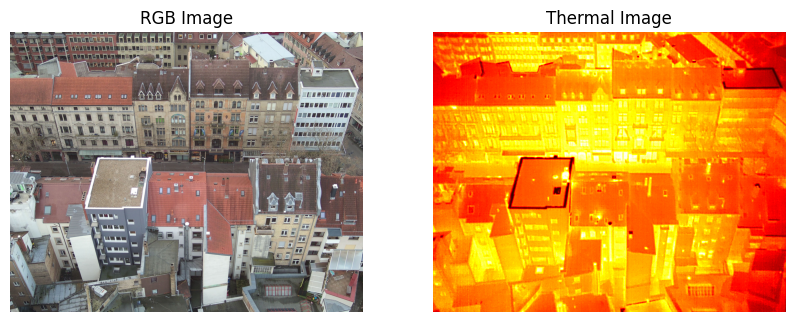

In [ ]:
import matplotlib.pyplot as plt
import cv2

# RGB görüntüyü ve termal görüntüyü ayırın
rgb_image = data[:, :, :3]  # İlk üç kanal RGB
thermal_image = data[:, :, 3]  # Dördüncü kanal termal

# RGB görüntüyü göstermek için
plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("RGB Image")
plt.imshow(cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB))  # BGR'yi RGB'ye çevirme
plt.axis('off')

# Termal görüntüyü göstermek için
plt.subplot(1, 2, 2)
plt.title("Thermal Image")
plt.imshow(thermal_image, cmap='hot')
plt.axis('off')

plt.show()


In [ ]:
!pip install pycocotools

from pycocotools.coco import COCO

# Eğitim etiket dosyasının yolunu belirtin
annotation_file = os.path.join(data_path, 'ann.json')

# COCO formatında etiketleri yükleyin
coco = COCO(annotation_file)

# İlk birkaç anotasyonu göster
ann_ids = coco.getAnnIds()
anns = coco.loadAnns(ann_ids[:5])
print(anns)


loading annotations into memory...
Done (t=1.07s)
creating index...
index created!
[{'id': 1, 'image_id': 0, 'bbox': [1315.0, 1421.0, 53.0, 102.0], 'area': 2186.5, 'iscrowd': 0, 'category_id': 0, 'segmentation': [[1319.0, 1446.0, 1337.0, 1421.0, 1337.0, 1456.0, 1368.0, 1456.0, 1323.0, 1523.0, 1315.0, 1449.0, 1319.0, 1446.0]]}, {'id': 2, 'image_id': 0, 'bbox': [224.0, 20.0, 129.0, 3.0], 'area': 233.0, 'iscrowd': 0, 'category_id': 0, 'segmentation': [[236.0, 23.0, 224.0, 23.0, 236.0, 23.0, 254.0, 23.0, 302.0, 23.0, 332.0, 23.0, 353.0, 23.0, 351.0, 20.0, 236.0, 22.0]]}, {'id': 3, 'image_id': 1, 'bbox': [1312.0, 1480.0, 71.0, 121.0], 'area': 3804.0, 'iscrowd': 0, 'category_id': 0, 'segmentation': [[1313.0, 1516.0, 1325.0, 1480.0, 1337.0, 1502.0, 1328.0, 1525.0, 1380.0, 1528.0, 1383.0, 1533.0, 1377.0, 1539.0, 1368.0, 1556.0, 1347.0, 1570.0, 1337.0, 1580.0, 1328.0, 1595.0, 1318.0, 1601.0, 1312.0, 1597.0, 1313.0, 1519.0, 1313.0, 1516.0]]}, {'id': 4, 'image_id': 1, 'bbox': [1214.0, 414.0, 489.

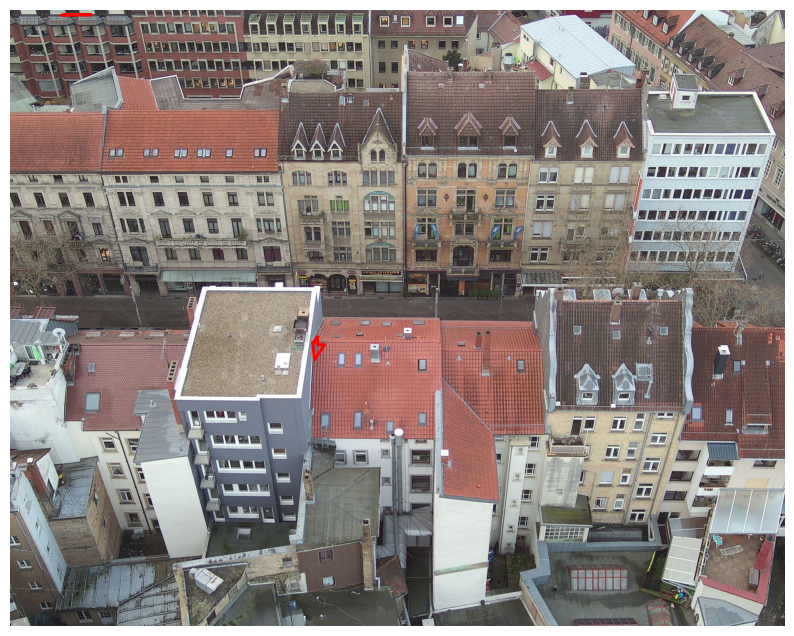

In [ ]:
# Örnek bir görüntünün ID'sini alın
image_id = coco.getImgIds()[0]
image_info = coco.loadImgs(image_id)[0]

# Görüntü dosyasının yolunu alın
image_file = os.path.join(data_path,image_info['file_name'])

# Görüntüyü yükleyin
image = np.load(image_file)

# RGB görüntüyü ayırın
rgb_image = image[:, :, :3]

# Anotasyonları yükleyin
ann_ids = coco.getAnnIds(imgIds=image_id)
anns = coco.loadAnns(ann_ids)

# Görüntüyü ve anotasyonları görselleştirin
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(rgb_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

# Anotasyonları çizmek için
for ann in anns:
    poly = np.array(ann['segmentation'][0]).reshape((len(ann['segmentation'][0]) // 2, 2))
    plt.plot(poly[:, 0], poly[:, 1], 'r', linewidth=2)

plt.show()


In [ ]:
!pip install numpy opencv-python matplotlib pycocotools


In [ ]:
import json
import os

# JSON dosyasının yolunu belirtin
json_path = '/content/drive/My Drive/thermalData/THERMAL/train/images/ann.json'

# JSON dosyasını yükleyin
with open(json_path) as f:
    data = json.load(f)

# JSON dosyasının anahtarlarını kontrol edin
print(data.keys())


dict_keys(['info', 'images', 'categories', 'licenses', 'annotations'])


In [ ]:
!pip install -U torch torchvision cython
!pip install 'git+https://github.com/facebookresearch/fvcore'


  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.7 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.2/797.2 MB 

In [ ]:
# GCC'nin kurulumu
!apt-get install gcc-5 g++-5

# GCC 5'i kullanma
!update-alternatives --install /usr/bin/gcc gcc /usr/bin/gcc-5 10
!update-alternatives --install /usr/bin/g++ g++ /usr/bin/g++-5 10

# Detectron2'nin kurulumu
!pip install 'git+https://github.com/facebookresearch/detectron2.git'


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
Package g++-5 is not available, but is referred to by another package.
This may mean that the package is missing, has been obsoleted, or
is only available from another source
However the following packages replace it:
  gcc-10-test-results gcc-9-test-results gcc-12-test-results gcc-11-test-results

E: Unable to locate package gcc-5
E: Package 'g++-5' has no installation candidate
update-alternatives: error: alternative path /usr/bin/gcc-5 doesn't exist
update-alternatives: error: alternative path /usr/bin/g++-5 doesn't exist
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-maflhs5w
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-maflhs5w
  Resolved https://github.com/facebookresearch/detectron2.git to commit 2a420edb307c9bdf640f036d3b196bed474b8593
  Preparing metadata (setup.py) .

In [ ]:
import detectron2
print("Detectron2 başarıyla kuruldu!")


Detectron2 başarıyla kuruldu!


In [ ]:
import os
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo


In [ ]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
from PIL import Image

def get_tbbr_dicts(img_dir):
    json_file = os.path.join(img_dir, "ann.json")
    with open(json_file) as f:
        img_anns = json.load(f)

    dataset_dicts = []
    for idx, v in enumerate(img_anns["images"]):
        record = {}

        filename = os.path.join(img_dir, v["file_name"])
        # Load .npy file and convert to PIL Image
        if filename.endswith('.npy'):
            array = np.load(filename)
            # Check the data type of the array
            print(f"Data type of array: {array.dtype}")
            print(f"Shape of array: {array.shape}")
            # Select RGB channels
            rgb_array = array[:, :, :3]
            # Convert the array to uint8
            rgb_array = rgb_array.astype(np.uint8)
            image = Image.fromarray(rgb_array)
            # Save as a temporary image file
            temp_filename = filename[:-4] + '.jpg' # or '.png'
            image.save(temp_filename)
            filename = temp_filename

        height, width = v["height"], v["width"]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        objs = []
        for anno in img_anns["annotations"]:
            if anno["image_id"] == v["id"]:
                px = anno["segmentation"][0][::2]
                py = anno["segmentation"][0][1::2]
                poly = [(x, y) for x, y in zip(px, py)]

                obj = {
                    "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                    "bbox_mode": BoxMode.XYXY_ABS,
                    "segmentation": [poly],
                    "category_id": anno["category_id"],
                }
                objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog

DatasetCatalog.register("tbbr_train", lambda d="train": get_tbbr_dicts("/content/drive/My Drive/thermalData/THERMAL/train/images"))
MetadataCatalog.get("tbbr_train").set(thing_classes=["thermal_bridge"])

DatasetCatalog.register("tbbr_test", lambda d="test": get_tbbr_dicts("/content/drive/My Drive/thermalData/THERMAL/test/images"))
MetadataCatalog.get("tbbr_test").set(thing_classes=["thermal_bridge"])

tbbr_metadata = MetadataCatalog.get("tbbr_train")

In [ ]:

import os # Importing the os module
from detectron2.config import get_cfg # Importing the get_cfg function from the detectron2.config module
from detectron2 import model_zoo # Importing the model_zoo from detectron2
from detectron2.engine import DefaultTrainer # Importing the DefaultTrainer class from detectron2.engine
from matplotlib.patches import Rectangle # Importing the Rectangle class from matplotlib.patches

cfg = get_cfg()             #https://github.com/facebookresearch/detectron2/blob/main/configs/COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("tbbr_train",)
cfg.DATASETS.TEST = ("tbbr_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # Termal köprü sınıfı sayısı

In [ ]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

[07/30 22:10:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a3ec72.pkl: 254MB [00:01, 222MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [ ]:
trainer.train()

NameError: name 'trainer' is not defined

In [ ]:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>